In [1]:
# ========================================
# 1. Mount Google Drive
# ========================================
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [8]:
# ========================================
# 2. Import libraries
# ========================================
import zipfile
import os
import random
import matplotlib.pyplot as plt
import skimage.io as io
from pycocotools.coco import COCO
import numpy as np

In [3]:
# ========================================
# 3. File paths (adjusted to your Drive structure)
# ========================================
zip_val = "/content/drive/MyDrive/infosys_ai_vision_extract/val2017.zip"
zip_ann = "/content/drive/MyDrive/infosys_ai_vision_extract/annotations_trainval2017.zip"

In [4]:
# Extract validation images
with zipfile.ZipFile(zip_val, 'r') as zip_ref:
    zip_ref.extractall("/content")


In [5]:
# Extract annotations
with zipfile.ZipFile(zip_ann, 'r') as zip_ref:
    zip_ref.extractall("/content")

In [6]:
# ========================================
# 4. Initialize COCO API
# ========================================
annFile = '/content/annotations/instances_val2017.json'
coco = COCO(annFile)

loading annotations into memory...
Done (t=0.61s)
creating index...
index created!


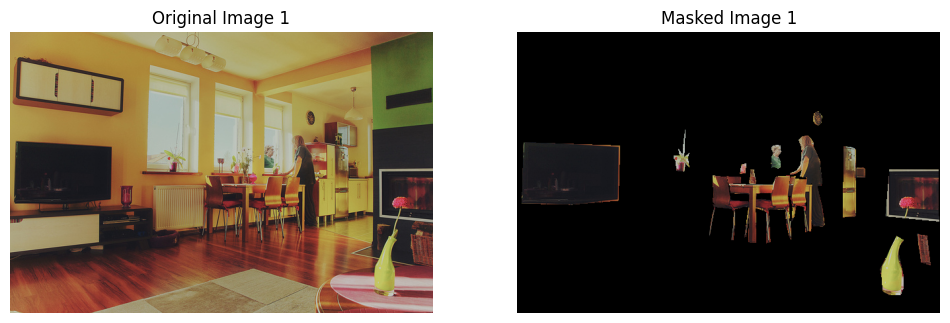

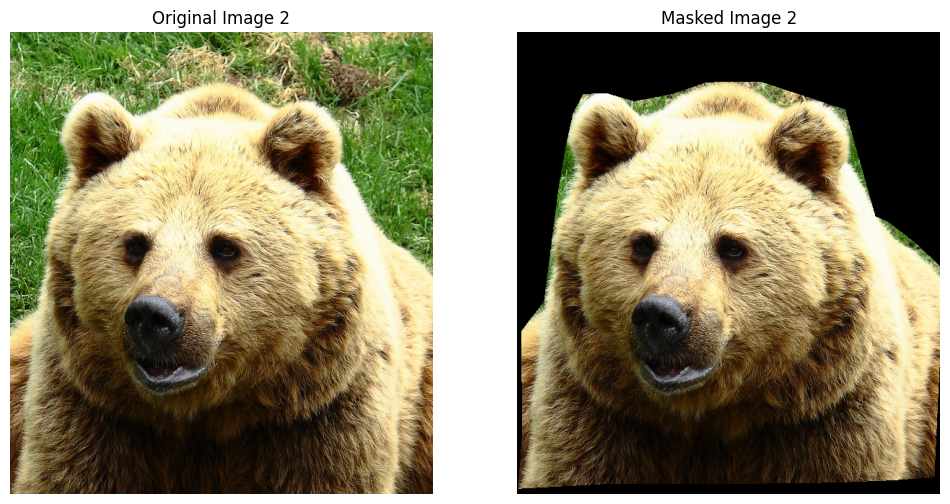

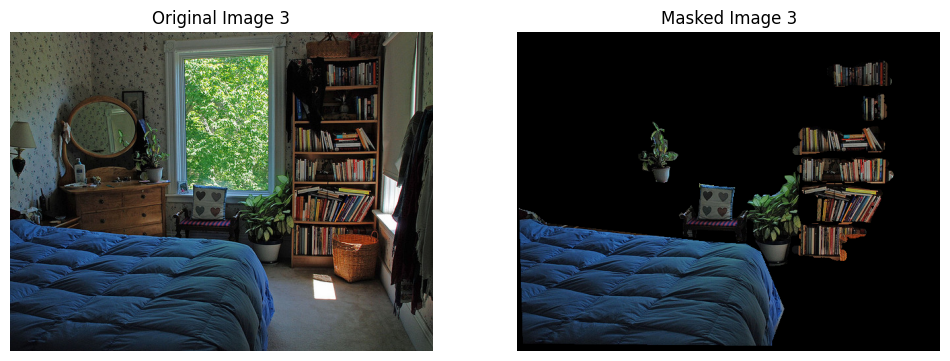

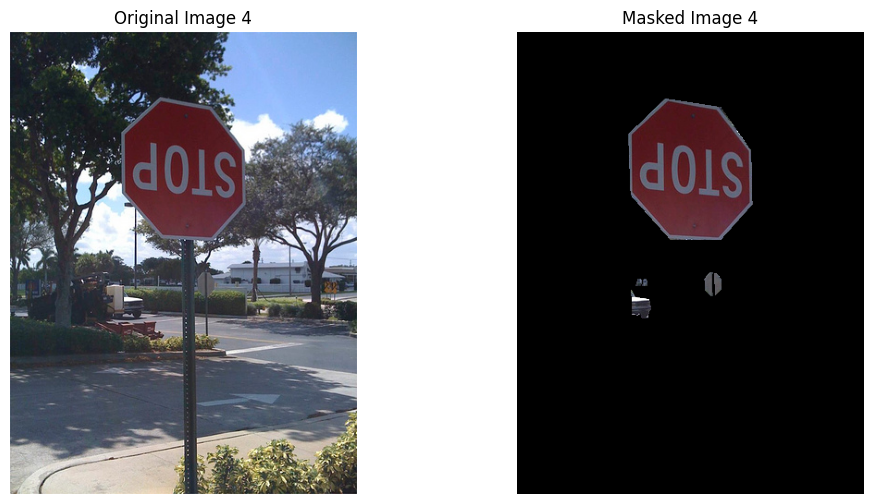

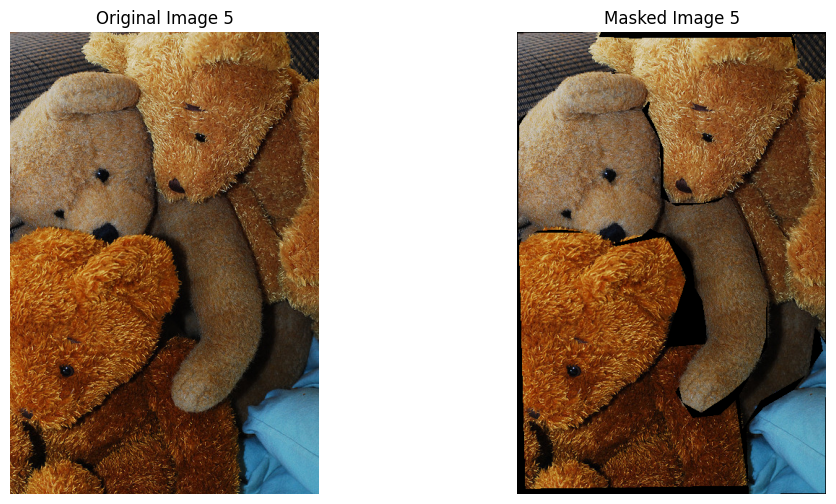

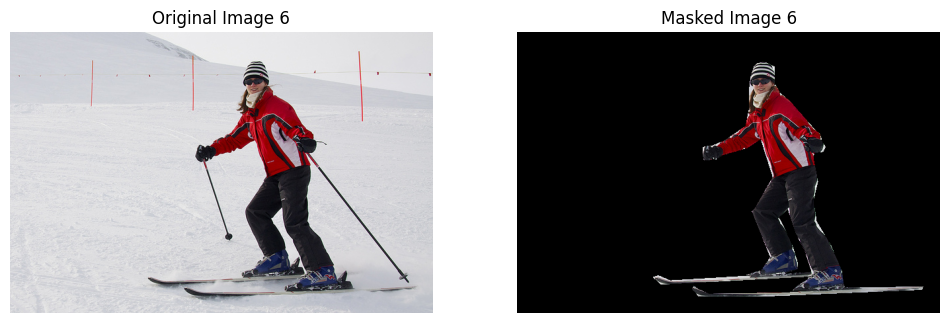

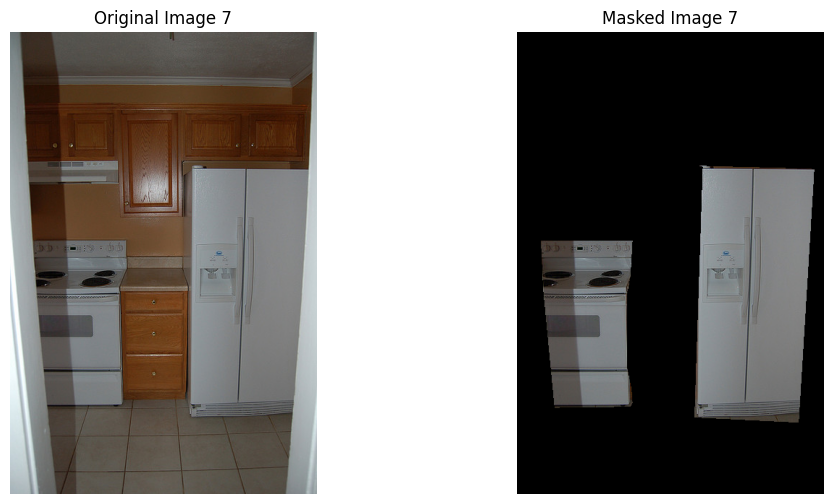

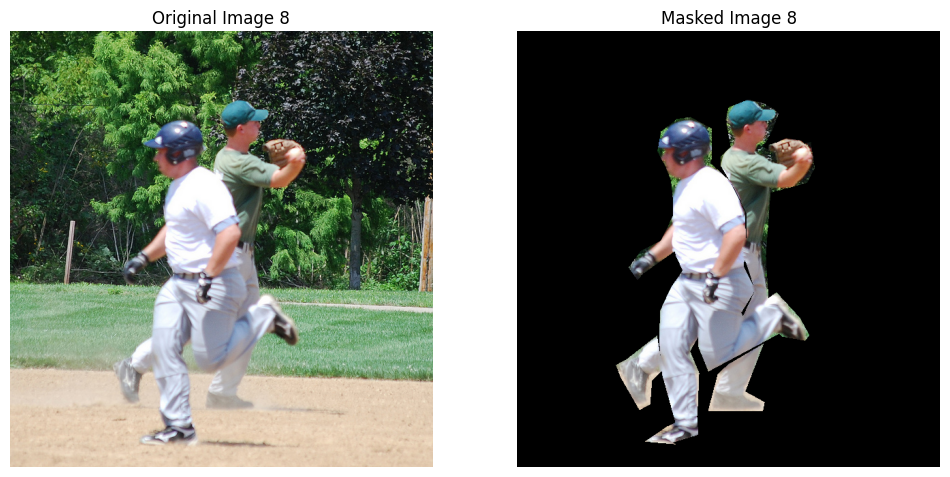

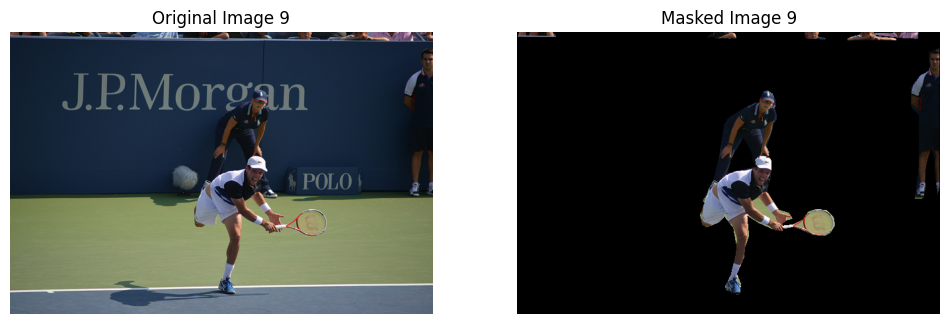

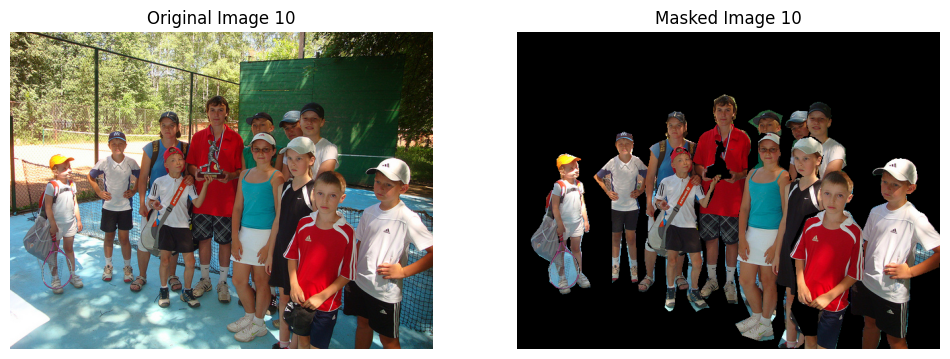

In [9]:
import glob

# Path to extracted validation images
val_dir = "/content/val2017"

# Get sorted list of image filenames
val_images = sorted(glob.glob(val_dir + "/*.jpg"))

# Take first 10 images
val_images_10 = val_images[:10]

for idx, img_path in enumerate(val_images_10):
    # Get image ID (from filename)
    img_id = int(os.path.basename(img_path).split(".")[0])

    # Load image
    I = io.imread(img_path)

    # Get annotations
    ann_ids = coco.getAnnIds(imgIds=img_id, iscrowd=None)
    anns = coco.loadAnns(ann_ids)

    # Build mask
    mask = np.zeros((I.shape[0], I.shape[1]), dtype=np.uint8)
    for ann in anns:
        m = coco.annToMask(ann)
        mask = np.maximum(mask, m)

    # Apply mask
    masked_img = np.zeros_like(I)
    if I.ndim == 3:
        for c in range(3):
            masked_img[:, :, c] = I[:, :, c] * mask
    else:
        masked_img = I * mask

    # Show side by side
    plt.figure(figsize=(12,6))
    plt.subplot(1,2,1)
    plt.title(f"Original Image {idx+1}")
    plt.imshow(I)
    plt.axis('off')

    plt.subplot(1,2,2)
    plt.title(f"Masked Image {idx+1}")
    plt.imshow(masked_img)
    plt.axis('off')

    plt.show()

loading annotations into memory...
Done (t=0.61s)
creating index...
index created!


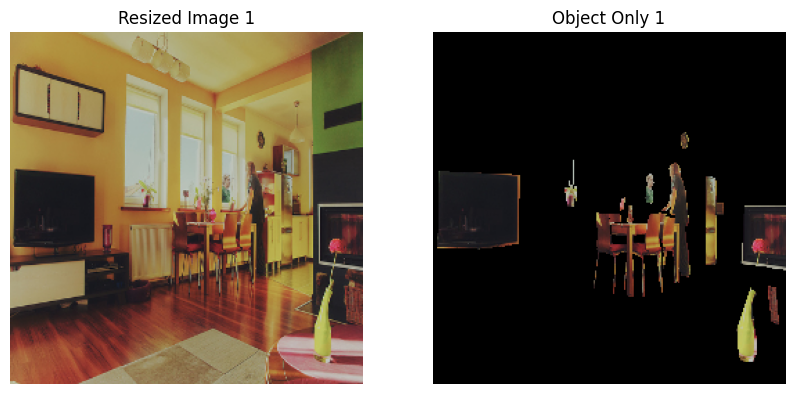

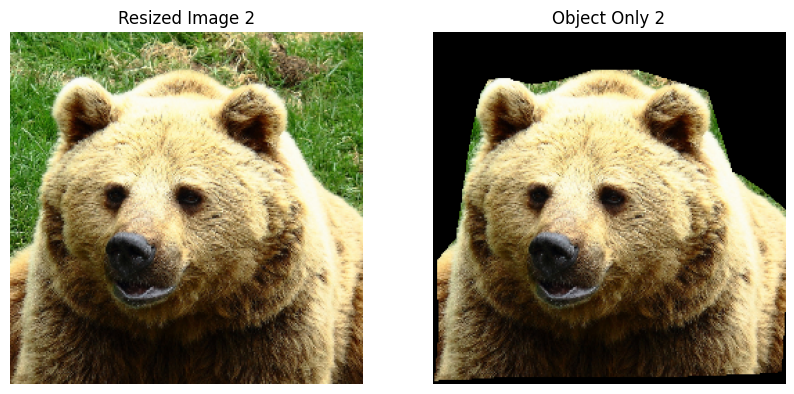

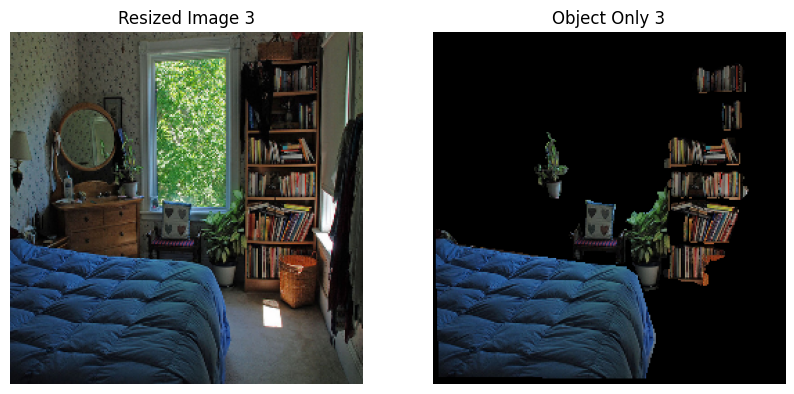

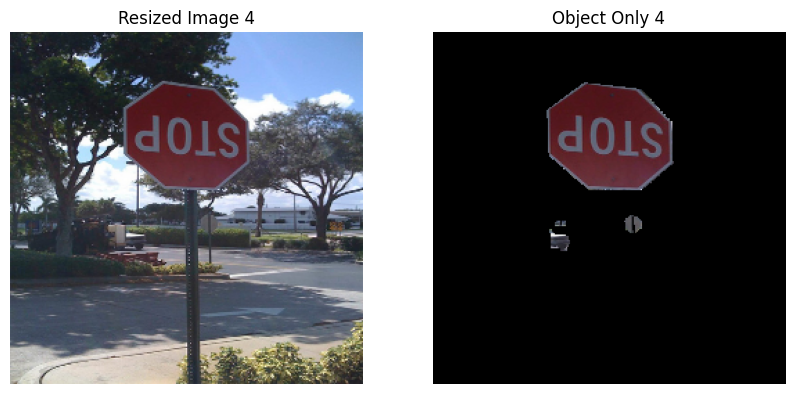

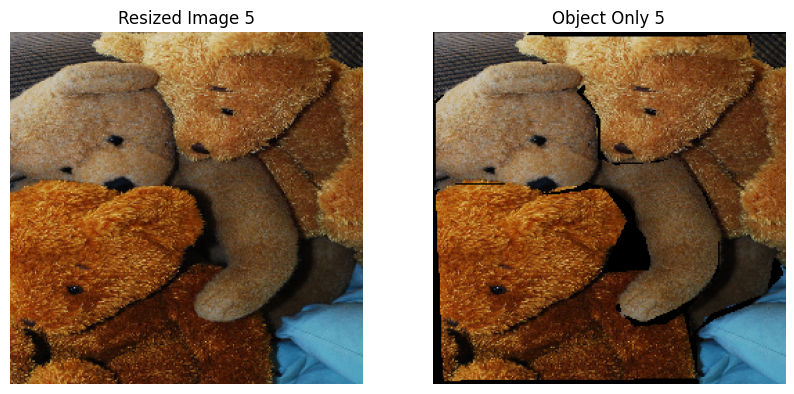

✅ All val2017 images processed: 255x255 resized + object-only masked


In [14]:
import cv2
import numpy as np
import glob
import os
import matplotlib.pyplot as plt
import skimage.io as io
from pycocotools.coco import COCO

# ================================
# Paths
# ================================
val_dir = "/content/val2017"
annFile = "/content/annotations/instances_val2017.json"
coco = COCO(annFile)

# ================================
# Collect all validation images
# ================================
val_images = sorted(glob.glob(val_dir + "/*.jpg"))

# Desired resize shape
resize_shape = (255, 255)

# ================================
# Loop through validation images
# ================================
for idx, img_path in enumerate(val_images):

    # Get image ID
    img_id = int(os.path.basename(img_path).split(".")[0])

    # Load image
    I = io.imread(img_path)

    # Convert grayscale → RGB
    if I.ndim == 2:
        I = cv2.cvtColor(I, cv2.COLOR_GRAY2RGB)

    # Load annotations for this image
    ann_ids = coco.getAnnIds(imgIds=img_id, iscrowd=None)
    anns = coco.loadAnns(ann_ids)

    # Build mask
    mask = np.zeros((I.shape[0], I.shape[1]), dtype=np.uint8)
    for ann in anns:
        m = coco.annToMask(ann)
        mask = np.maximum(mask, m)

    # Resize both image and mask
    I_resized = cv2.resize(I, resize_shape)
    mask_resized = cv2.resize(mask, resize_shape, interpolation=cv2.INTER_NEAREST)

    # Apply mask to keep object only (background black)
    masked_img = np.zeros_like(I_resized)
    for c in range(3):  # for each color channel
        masked_img[:, :, c] = I_resized[:, :, c] * mask_resized

    # (Optional) visualize first 5 only
    if idx < 5:
        plt.figure(figsize=(10,5))
        plt.subplot(1,2,1); plt.imshow(I_resized); plt.title(f"Resized Image {idx+1}"); plt.axis("off")
        plt.subplot(1,2,2); plt.imshow(masked_img); plt.title(f"Object Only {idx+1}"); plt.axis("off")
        plt.show()

print("✅ All val2017 images processed: 255x255 resized + object-only masked")


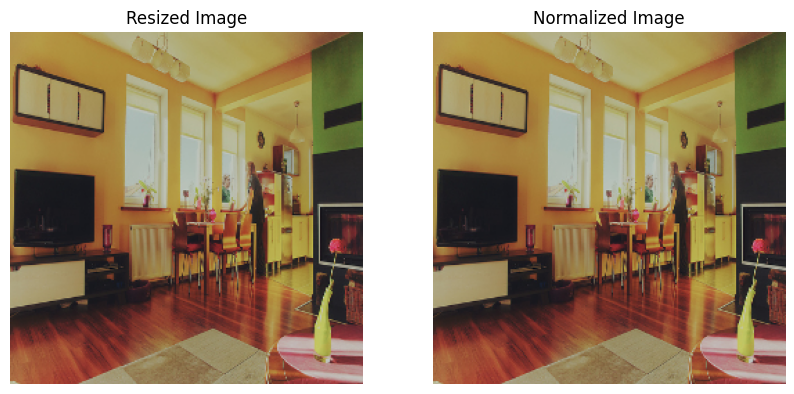

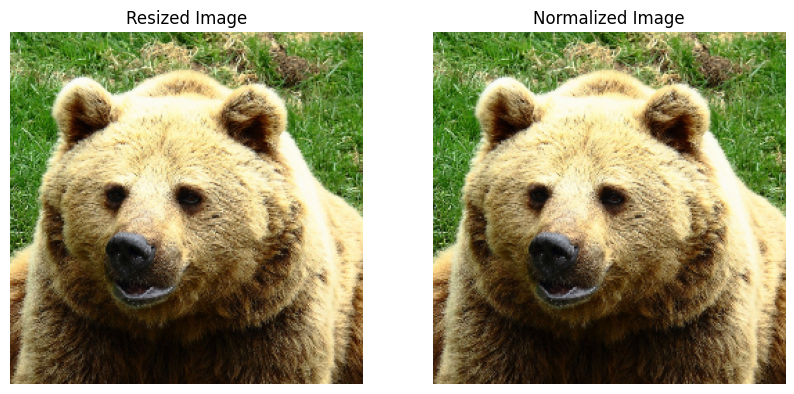

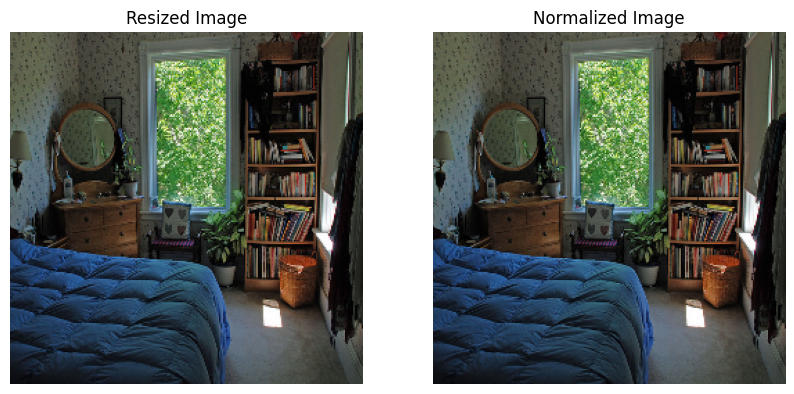

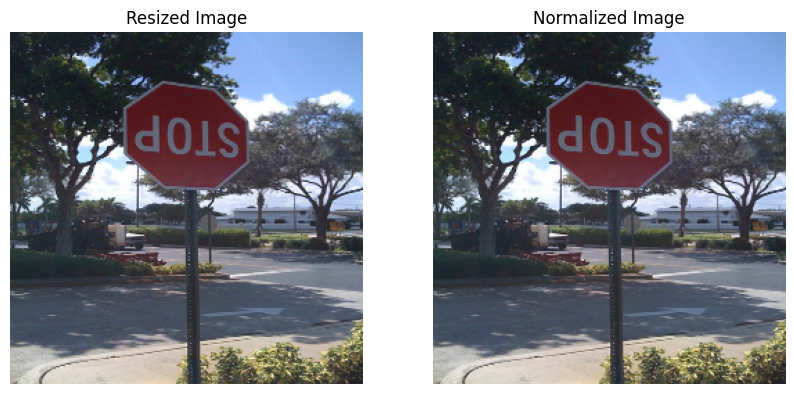

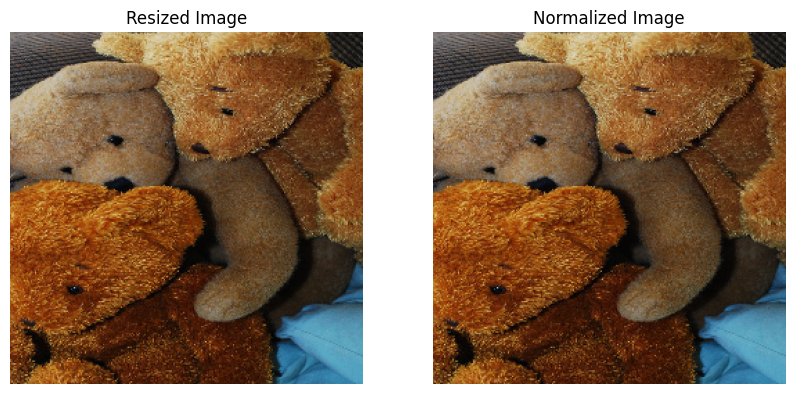

✅ Images resized to 255x255 and normalized to [0,1]


In [15]:
import cv2
import numpy as np
import glob
import os
import matplotlib.pyplot as plt

# ================================
# Path to resized validation images
# (we can reuse from val2017 directly since we resize on-the-fly)
# ================================
val_dir = "/content/val2017"
val_images = sorted(glob.glob(val_dir + "/*.jpg"))

resize_shape = (255, 255)

for idx, img_path in enumerate(val_images[:5]):  # demo on 5 images

    # Load image
    I = cv2.imread(img_path)

    # Convert BGR → RGB
    I = cv2.cvtColor(I, cv2.COLOR_BGR2RGB)

    # Resize
    I_resized = cv2.resize(I, resize_shape)

    # 🔹 Normalize to [0,1]
    I_normalized = I_resized.astype(np.float32) / 255.0

    # Show comparison
    plt.figure(figsize=(10,5))
    plt.subplot(1,2,1); plt.imshow(I_resized); plt.title("Resized Image"); plt.axis("off")
    plt.subplot(1,2,2); plt.imshow(I_normalized); plt.title("Normalized Image"); plt.axis("off")
    plt.show()

print("✅ Images resized to 255x255 and normalized to [0,1]")


In [16]:
import cv2
import os
import numpy as np
import albumentations as A
import matplotlib.pyplot as plt

# Paths
save_img_dir = "/content/augmented_dataset/images"
save_mask_dir = "/content/augmented_dataset/masks"
os.makedirs(save_img_dir, exist_ok=True)
os.makedirs(save_mask_dir, exist_ok=True)

# Desired resize size
resize_shape = (255, 255)

# Define augmentation pipeline
transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.3),
    A.RandomRotate90(p=0.5),
    A.RandomBrightnessContrast(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=30, p=0.5)
])

# Loop through ALL validation images
for idx, img_path in enumerate(val_images):
    img_id = int(os.path.basename(img_path).split(".")[0])
    I = io.imread(img_path)

    # Build mask from annotations
    ann_ids = coco.getAnnIds(imgIds=img_id, iscrowd=None)
    anns = coco.loadAnns(ann_ids)
    mask = np.zeros((I.shape[0], I.shape[1]), dtype=np.uint8)
    for ann in anns:
        m = coco.annToMask(ann)
        mask = np.maximum(mask, m)

    # Resize image and mask
    I_resized = cv2.resize(I, resize_shape)
    mask_resized = cv2.resize(mask, resize_shape, interpolation=cv2.INTER_NEAREST)

    # Apply augmentation
    augmented = transform(image=I_resized, mask=mask_resized)
    I_aug = augmented["image"]
    mask_aug = augmented["mask"]

    # Save augmented versions
    cv2.imwrite(f"{save_img_dir}/aug_{idx}.jpg", cv2.cvtColor(I_aug, cv2.COLOR_RGB2BGR))
    cv2.imwrite(f"{save_mask_dir}/aug_{idx}.png", mask_aug)

print("✅ All augmented images and masks saved to dataset!")


/usr/local/lib/python3.12/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


✅ All augmented images and masks saved to dataset!


Showing 5 augmented samples from: /content/augmented_dataset/images / /content/augmented_dataset/masks


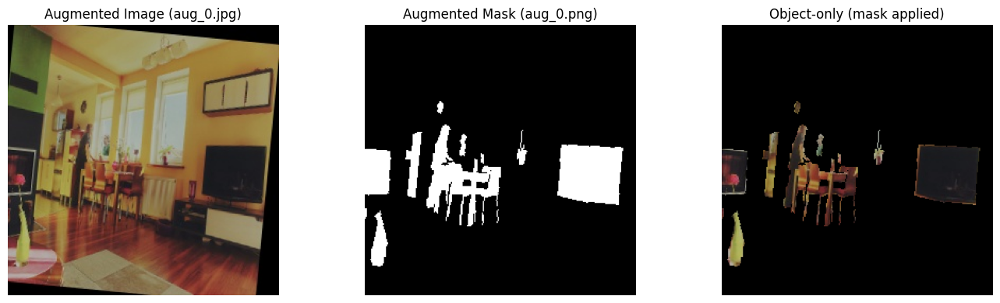

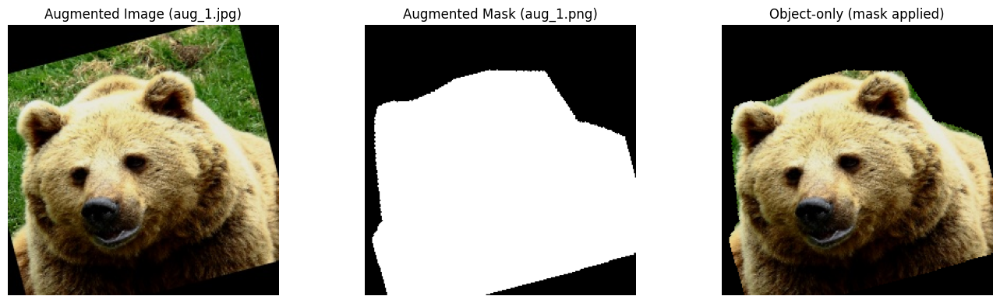

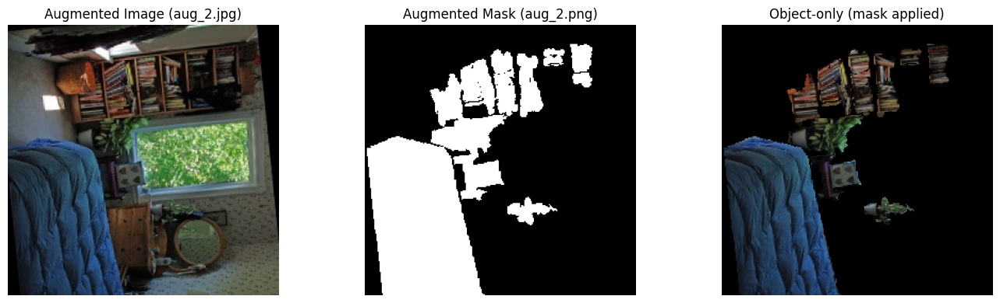

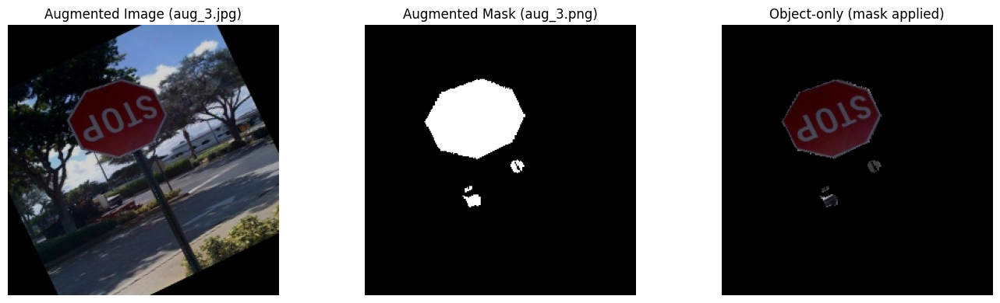

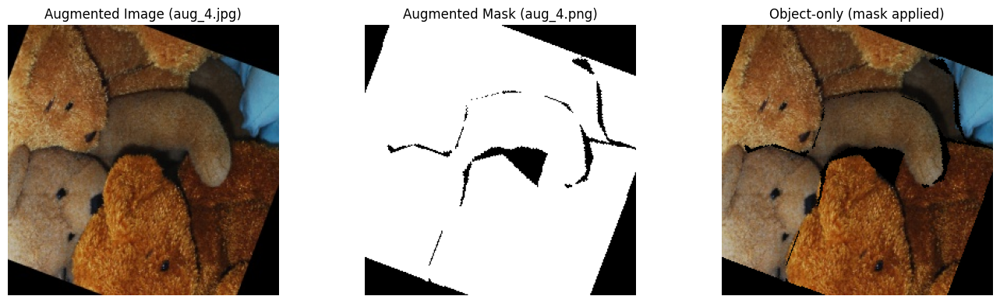

In [19]:
import os, re, glob, random
import cv2
import numpy as np
import matplotlib.pyplot as plt

aug_img_dir = "/content/augmented_dataset/images"
aug_mask_dir = "/content/augmented_dataset/masks"

# Helper: extract numeric id from "aug_123.jpg/png"
def idx_from_name(p):
    m = re.search(r'aug_(\d+)\.', os.path.basename(p))
    return int(m.group(1)) if m else None

# Collect and pair by numeric index (robust against lexicographic sort issues)
img_paths = glob.glob(os.path.join(aug_img_dir, "aug_*.jpg"))
mask_paths = glob.glob(os.path.join(aug_mask_dir, "aug_*.png"))
img_map  = {idx_from_name(p): p for p in img_paths if idx_from_name(p) is not None}
mask_map = {idx_from_name(p): p for p in mask_paths if idx_from_name(p) is not None}
common_ids = sorted(set(img_map.keys()) & set(mask_map.keys()))

# Pick which 5 to show: first 5 (change to random.sample(common_ids, 5) for random)
show_ids = common_ids[:5] if len(common_ids) >= 5 else common_ids

print(f"Showing {len(show_ids)} augmented samples from: {aug_img_dir} / {aug_mask_dir}")
for k in show_ids:
    img = cv2.cvtColor(cv2.imread(img_map[k]), cv2.COLOR_BGR2RGB)
    mask = cv2.imread(mask_map[k], cv2.IMREAD_GRAYSCALE)  # 0/255

    # Ensure binary mask is 0/1 for multiplication
    bin_mask = (mask > 0).astype(np.uint8)

    # Object-only image (background black)
    obj_only = img * bin_mask[:, :, None]

    # (Optional) overlay mask contours to visually confirm alignment
    overlay = img.copy()
    contours, _ = cv2.findContours(bin_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours, -1, (255, 0, 0), 2)

    # Show
    plt.figure(figsize=(14,4))
    plt.subplot(1,3,1); plt.imshow(img);      plt.title(f"Augmented Image (aug_{k}.jpg)"); plt.axis('off')
    plt.subplot(1,3,2); plt.imshow(mask, cmap='gray'); plt.title(f"Augmented Mask (aug_{k}.png)"); plt.axis('off')
    plt.subplot(1,3,3); plt.imshow(obj_only); plt.title("Object-only (mask applied)"); plt.axis('off')
    plt.tight_layout()
    plt.show()


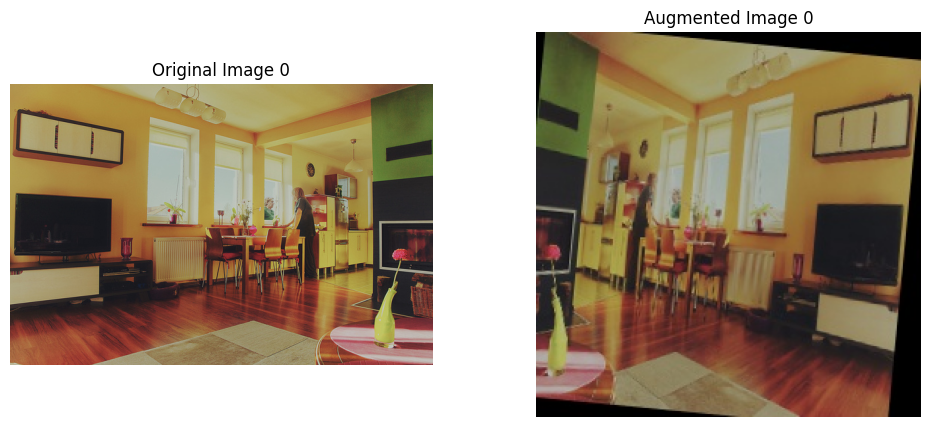

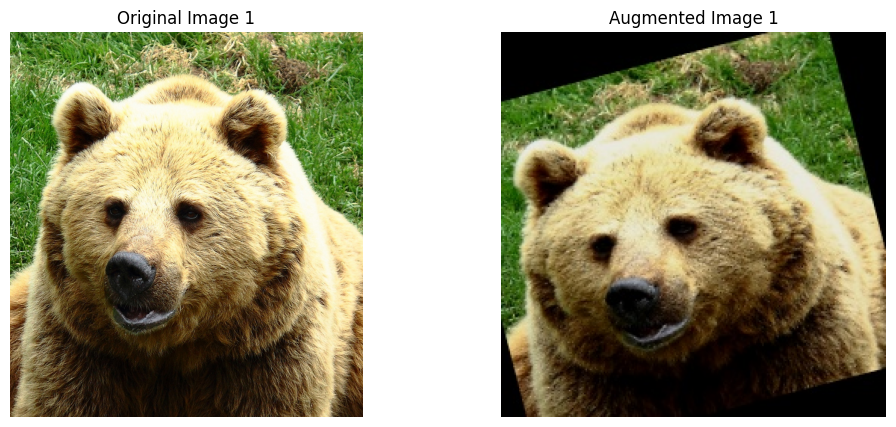

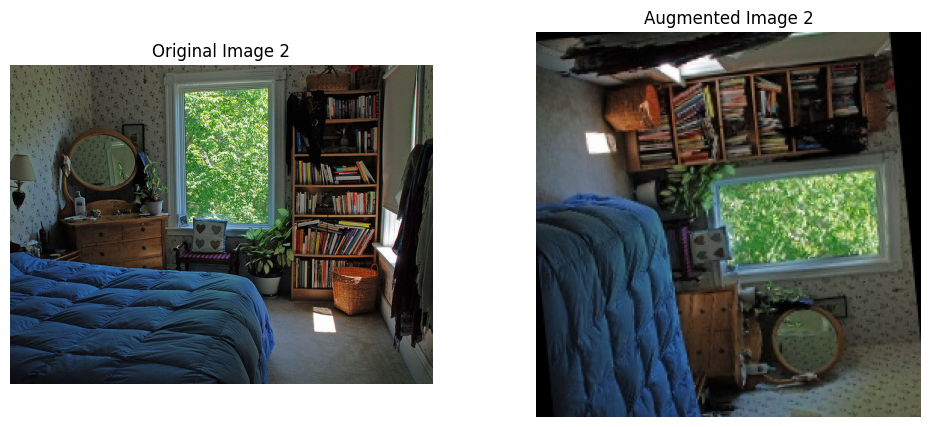

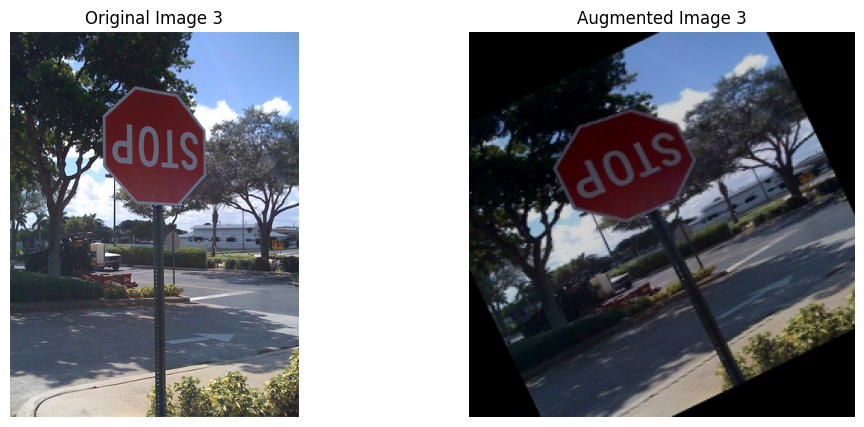

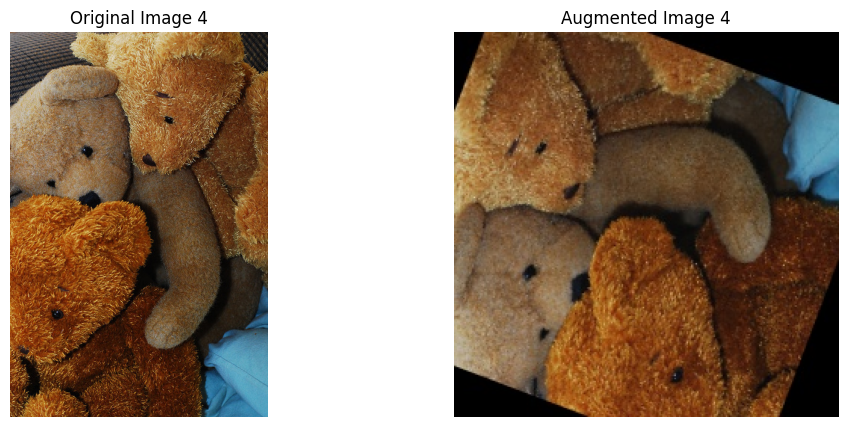

In [20]:
import cv2
import matplotlib.pyplot as plt

# Show comparison for first 5 validation images
for i in range(5):
    # --- Original ---
    orig_path = val_images[i]
    orig_img = cv2.cvtColor(cv2.imread(orig_path), cv2.COLOR_BGR2RGB)

    # --- Augmented ---
    aug_path = f"/content/augmented_dataset/images/aug_{i}.jpg"
    aug_img = cv2.cvtColor(cv2.imread(aug_path), cv2.COLOR_BGR2RGB)

    # Plot side by side
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(orig_img)
    plt.title(f"Original Image {i}")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(aug_img)
    plt.title(f"Augmented Image {i}")
    plt.axis('off')

    plt.show()
